<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#PlayGround" data-toc-modified-id="PlayGround-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>PlayGround</a></span></li><li><span><a href="#Main-code" data-toc-modified-id="Main-code-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Main code</a></span></li><li><span><a href="#Test" data-toc-modified-id="Test-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Test</a></span></li></ul></div>

# Main code

In [1]:
from fastai.vision import *
from PIL import Image, ImageDraw, ImageFilter, ImageFont

In [2]:
from fastai.callbacks import *
from fastai.vision.gan import *

In [3]:
import os

os.environ["TORCH_HOME"] = "/media/subhaditya/DATA/COSMO/Datasets-Useful"

In [4]:
path = Path("/media/subhaditya/DATA/COSMO/Datasets/shadow_gt5")
path_hr = path / "noshadow"
path_lr = path / "shadow"

In [5]:
il = ImageList.from_folder(path_hr)

In [6]:
il

ImageList (5110 items)
Image (3, 600, 800),Image (3, 600, 800),Image (3, 600, 800),Image (3, 600, 800),Image (3, 600, 800)
Path: /media/subhaditya/DATA/COSMO/Datasets/shadow_gt5/noshadow

In [7]:
bs, size = 32, 128
# bs,size = 24,160
# bs,size = 8,256

In [8]:
arch = models.resnet34
src = ImageImageList.from_folder(path_lr).split_by_rand_pct()

In [9]:
def get_data(bs, size):
    data = (
        src.label_from_func(lambda x: path_hr / x.name)
        .transform(get_transforms(max_zoom=2.0), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats, do_y=True)
    )

    #     data.c = 3
    return data

In [31]:
data_gen = get_data(32, 128)

In [32]:
data_gen

ImageDataBunch;

Train: LabelList (4088 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /media/subhaditya/DATA/COSMO/Datasets/shadow_gt5/shadow;

Valid: LabelList (1022 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /media/subhaditya/DATA/COSMO/Datasets/shadow_gt5/shadow;

Test: None

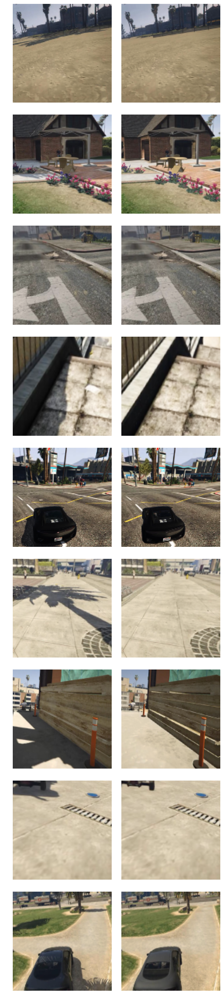

In [33]:
data_gen.show_batch(9)

In [34]:
learn_gen = None
gc.collect()

57984

# MSE

In [35]:
from torch.optim import *

In [36]:
loss = nn.L1Loss()

In [37]:
learn_gen = unet_learner(
    data_gen,
    models.resnet34,
    wd=1e-3,
    blur=True,
    norm_type=NormType.Weight,
    self_attention=False,
    #     metrics = [dice],
    callback_fns=ShowGraph,
    loss_func=loss,
    opt_func=AdamW,
).to_fp16()

epoch,train_loss,valid_loss,time
0,0.676899,#na#,00:39


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


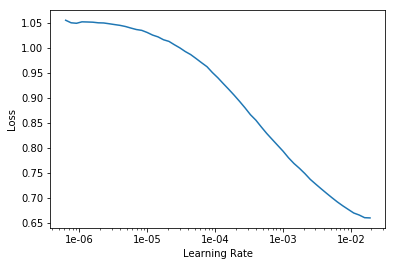

In [29]:
learn_gen.unfreeze()
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,time
0,0.361254,0.328277,00:46
1,0.293046,0.284305,00:45
2,0.269009,0.265088,00:45
3,0.269004,0.284231,00:42
4,0.257740,0.279957,00:40
5,0.254747,0.252777,00:41
6,0.246135,0.249787,00:43
7,0.238253,0.236016,00:40
8,0.227330,0.235056,00:45
9,0.232211,0.237269,00:46


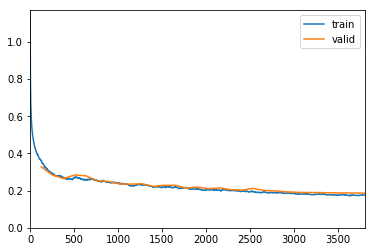

In [38]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(30, slice(1e-5, 1e-2), wd=10e-3)

In [39]:
learn_gen.save("st-1-w")

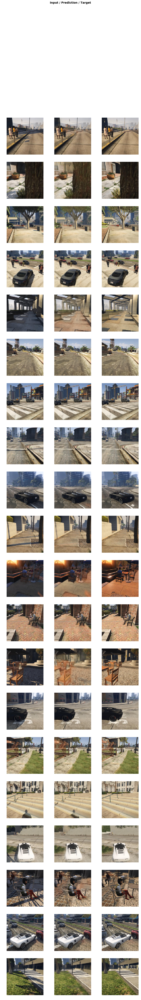

In [40]:
learn_gen.show_results(rows=20)

epoch,train_loss,valid_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


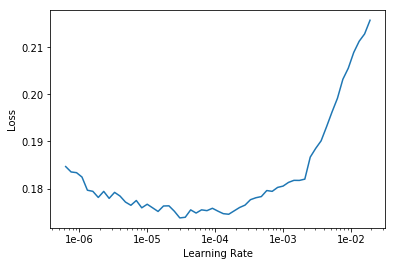

In [45]:
learn_gen.unfreeze()
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,time
0,0.177959,0.186873,00:40
1,0.174824,0.186878,00:40
2,0.176023,0.186587,00:40
3,0.173966,0.186166,00:40
4,0.174235,0.185400,00:40
5,0.175103,0.185360,00:40
6,0.173846,0.184825,00:41
7,0.172691,0.184550,00:40
8,0.172429,0.184071,00:40
9,0.173638,0.184075,00:40


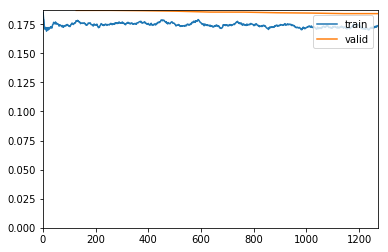

In [46]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(10, slice(1e-6, 3e-4), wd=1e-3)

In [47]:
learn_gen.save("st-2")

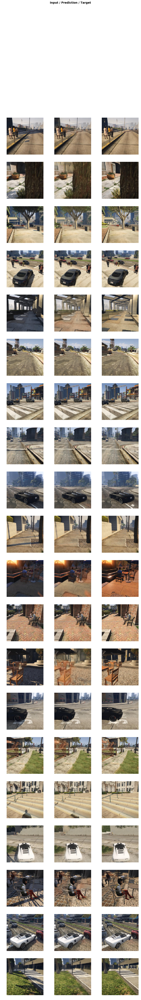

In [48]:
learn_gen.show_results(rows=20)

# Reverse

In [1]:
from fastai.vision import *
from PIL import Image, ImageDraw, ImageFilter, ImageFont

In [2]:
from fastai.callbacks import *
from fastai.vision.gan import *

In [3]:
import os

os.environ["TORCH_HOME"] = "/media/subhaditya/DATA/COSMO/Datasets-Useful"

In [4]:
path = Path("/media/subhaditya/DATA/COSMO/Datasets/shadow_gt5")
path_lr = path / "noshadow"
path_hr = path / "shadow"

In [5]:
il = ImageList.from_folder(path_hr)

In [6]:
il

ImageList (5110 items)
Image (3, 600, 800),Image (3, 600, 800),Image (3, 600, 800),Image (3, 600, 800),Image (3, 600, 800)
Path: /media/subhaditya/DATA/COSMO/Datasets/shadow_gt5/shadow

In [7]:
bs, size = 32, 128
# bs,size = 24,160
# bs,size = 8,256

In [8]:
arch = models.resnet34
src = ImageImageList.from_folder(path_lr).split_by_rand_pct()

In [9]:
def get_data(bs, size):
    data = (
        src.label_from_func(lambda x: path_hr / x.name)
        .transform(get_transforms(max_zoom=2.0), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats, do_y=True)
    )

    #     data.c = 3
    return data

In [10]:
data_gen = get_data(32, 128)

In [11]:
data_gen

ImageDataBunch;

Train: LabelList (4088 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /media/subhaditya/DATA/COSMO/Datasets/shadow_gt5/noshadow;

Valid: LabelList (1022 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /media/subhaditya/DATA/COSMO/Datasets/shadow_gt5/noshadow;

Test: None

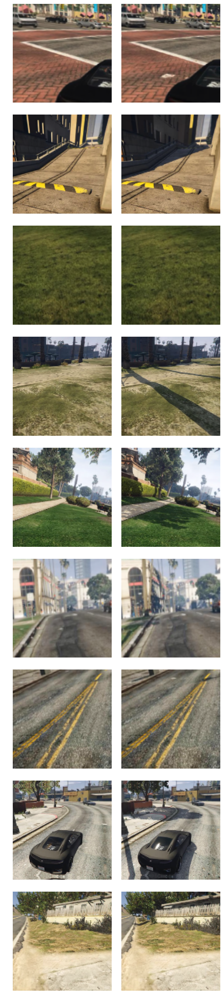

In [12]:
data_gen.show_batch(9)

In [13]:
learn_gen = None
gc.collect()

35209

# MSE

In [14]:
from torch.optim import *

In [15]:
loss = nn.L1Loss()

In [16]:
learn_gen = unet_learner(
    data_gen,
    models.resnet34,
    wd=1e-3,
    blur=True,
    norm_type=NormType.Weight,
    self_attention=False,
    #     metrics = [dice],
    callback_fns=ShowGraph,
    loss_func=loss,
    opt_func=AdamW,
).to_fp16()

epoch,train_loss,valid_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


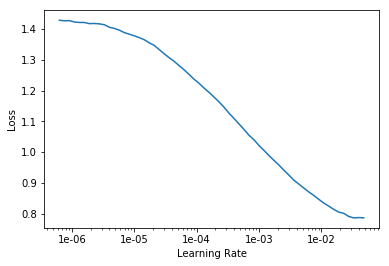

In [17]:
learn_gen.unfreeze()
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,time
0,1.280015,1.260571,00:39
1,1.081056,1.034392,00:39
2,0.883291,0.826276,00:38
3,0.678474,0.633081,00:38
4,0.549754,0.540431,00:38
5,0.489119,0.499221,00:38
6,0.454030,0.471465,00:38
7,0.440636,0.451780,00:38
8,0.428186,0.435208,00:39
9,0.411675,0.422966,00:39


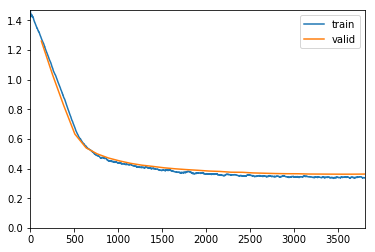

In [18]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(30, slice(1e-5), wd=10e-3)

In [19]:
learn_gen.save("rev-st-1-w")

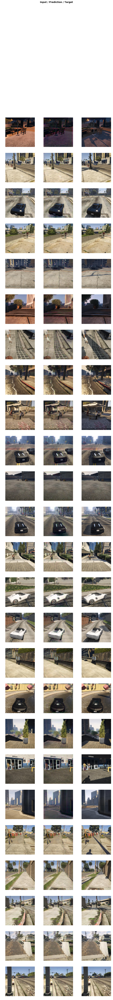

In [22]:
learn_gen.show_results(rows=25)

epoch,train_loss,valid_loss,time
0,0.336902,0.362712,00:40
1,0.338519,0.361627,00:40
2,0.339645,0.360161,00:39
3,0.336436,0.358813,00:39
4,0.336143,0.354793,00:40
5,0.332331,0.354150,00:38
6,0.330698,0.351214,00:39
7,0.328835,0.349021,00:38
8,0.324398,0.345689,00:40
9,0.319727,0.344870,00:39


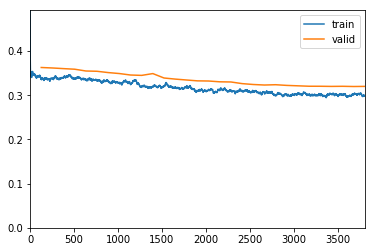

In [23]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(30, slice(1e-5), wd=10e-3)

epoch,train_loss,valid_loss,time
0,0.302248,0.320210,00:38
1,0.300923,0.320156,00:40
2,0.301356,0.320723,00:39
3,0.299020,0.318097,00:40
4,0.305209,0.320659,00:40
5,0.299034,0.320732,00:40
6,0.300426,0.317814,00:39
7,0.295686,0.320056,00:40
8,0.303746,0.314795,00:40
9,0.303887,0.313164,00:40


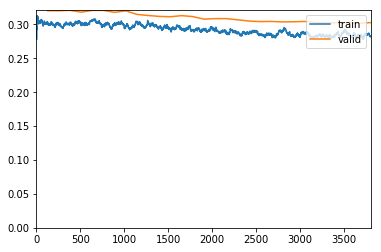

In [24]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(30, slice(1e-5), wd=10e-3)


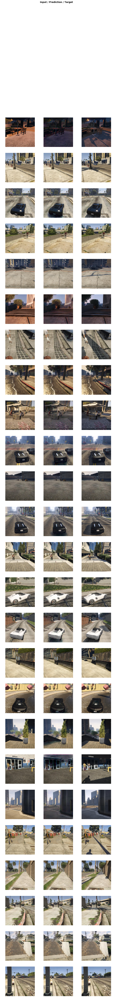

In [25]:
learn_gen.show_results(rows=25)

# Feature loss

In [1]:
from fastai.vision import *
from PIL import Image, ImageDraw, ImageFilter, ImageFont

In [2]:
from fastai.callbacks import *
from fastai.vision.gan import *

In [3]:
import os

os.environ["TORCH_HOME"] = "/media/subhaditya/DATA/COSMO/Datasets-Useful"

In [4]:
path = Path("/media/subhaditya/DATA/COSMO/Datasets/shadow_gt5")
path_hr = path / "noshadow"
path_lr = path / "shadow"

In [5]:
il = ImageList.from_folder(path_hr)

In [6]:
il

ImageList (5110 items)
Image (3, 600, 800),Image (3, 600, 800),Image (3, 600, 800),Image (3, 600, 800),Image (3, 600, 800)
Path: /media/subhaditya/DATA/COSMO/Datasets/shadow_gt5/noshadow

In [7]:
bs, size = 32, 128
# bs,size = 24,160
# bs,size = 8,256

In [8]:
arch = models.resnet34
src = ImageImageList.from_folder(path_lr).split_by_rand_pct()

In [9]:
def get_data(bs, size):
    data = (
        src.label_from_func(lambda x: path_hr / x.name)
        .transform(get_transforms(max_zoom=2.0), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats, do_y=True)
    )

    #     data.c = 3
    return data

In [10]:
data_gen = get_data(bs, size)

In [11]:
from torch.optim import *
from torch import nn
import torch.nn.functional as F
from torchvision.models import resnet34

In [12]:
base_loss = F.l1_loss

In [13]:
def gram_matrix(x):
    n, c, h, w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1, 2)) / (c * h * w)

In [14]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layers, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = layers
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = (
            ["pixel",]
            + [f"feat_{i}" for i in range(len(layers))]
            + [f"gram_{i}" for i in range(len(layers))]
        )

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]

    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input, target)]
        self.feat_losses += [
            base_loss(f_in, f_out) * w
            for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)
        ]
        self.feat_losses += [
            base_loss(gram_matrix(f_in), gram_matrix(f_out)) * w ** 2 * 5e3
            for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)
        ]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)

    def __del__(self):
        self.hooks.remove()

In [15]:
res_m = models.resnet34()

In [ ]:
res_m.to("cuda")

In [ ]:
requires_grad(res_m, False)
res_m.avgpool = nn.AvgPool2d(kernel_size=2, stride=1, padding=0)
res_m.fc = nn.Linear(in_features=4608, out_features=1000, bias=True)
layers = [res_m.layer2, res_m.layer3, res_m.layer4]
feat_loss = FeatureLoss(res_m, layers=layers, layer_wgts=[5, 15, 2])

In [ ]:
learn = unet_learner(
    data_gen,
    models.resnet34,
    wd=1e-3,
    loss_func=feat_loss,
    callback_fns=LossMetrics,
    blur=True,
    norm_type=NormType.Weight,
).to_fp16()

In [24]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


RuntimeError: _thnn_conv2d_forward not supported on CPUType for Half

epoch,train_loss,valid_loss,dice,time
0,0.326807,0.677864,0.081731,00:48
1,0.274688,0.558942,0.157678,00:49
2,0.229363,0.457402,0.210325,00:50
3,0.213518,0.359199,0.174192,00:49
4,0.205987,0.335548,0.196805,00:48
5,0.187168,0.319838,0.198950,00:49
6,0.180457,0.264868,0.196401,00:48
7,0.174136,0.239341,0.188926,00:48


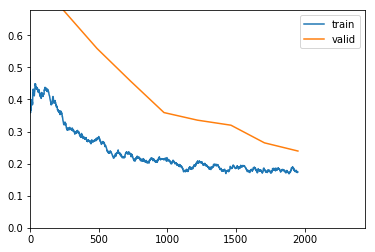

KeyboardInterrupt: 

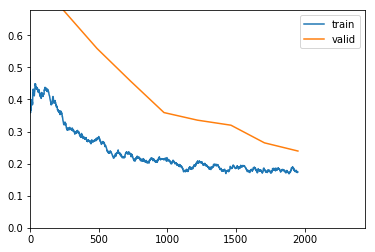

In [57]:
learn.fit_one_cycle(10, max_lr=slice(1e-6), wd=10e-4)

epoch,train_loss,valid_loss,dice,time
0,0.042592,0.417564,0.083472,00:27
1,0.046368,0.179589,0.210428,00:27
2,0.056034,0.148946,0.222350,00:28
3,0.031931,0.108784,0.349626,00:27
4,0.031074,0.052411,0.561679,00:27
5,0.027141,0.063126,0.553885,00:27
6,0.024037,0.060195,0.556755,00:27
7,0.020859,0.044898,0.616341,00:26
8,0.022918,0.043997,0.627805,00:26
9,0.021517,0.039800,0.659902,00:26


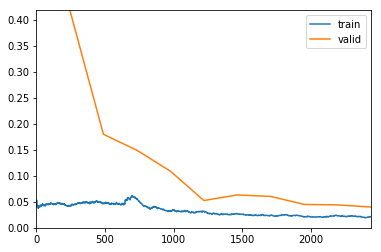

In [86]:
learn.unfreeze()
learn.fit_one_cycle(10, slice(1e-4), wd=1e-4)